In [12]:
import numpy as np
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
import time
from PIL import Image
import math



In [2]:
def show_images(*images):
    # Tạo một khung đồ thị với 1 hàng và số lượng hình ảnh cột
    fig, axs = plt.subplots(1, len(images), figsize=(5 * len(images), 5))

    # Nếu chỉ có một hình ảnh, axs sẽ không phải là một mảng
    # Do đó, chúng ta cần chuyển nó thành một mảng để có thể lặp qua nó
    if len(images) == 1:
        axs = [axs]

    # Show images
    for i, img in enumerate(images):
        # If image have less than 3 channels, show it in gray 
        if img.ndim < 3:
            axs[i].imshow(img, cmap='gray')
        else:
            axs[i].imshow(img)
        axs[i].set_title(f'Image {i+1}')

    plt.show()


In [6]:
def InfoImage(IM):
    Image = IM
    Width = Image.shape[1]
    Height = Image.shape[0]
    Channel = len(Image.shape)
    print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)
    
    if(Channel == 2):
        print("Min Intensity: ", IM.min(), " Max Intensity: ", IM.max())
    else:
        print("Red   - Min Intensity: ", IM[:,:,0].min(), " Max Intensity: ", IM[:,:,0].max())
        print("Green - Min Intensity: ", IM[:,:,1].min(), " Max Intensity: ", IM[:,:,1].max())
        print("Blue  - Min Intensity: ", IM[:,:,2].min(), " Max Intensity: ", IM[:,:,2].max())        

# **Bài 1**

In [65]:
#Đọc ảnh
img1 = plt.imread('C:/Users/trand/Documents/Digital Image Processing/data/imgtest.jpg')
#Chuyển đổi ảnh sang ảnh xám
gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)

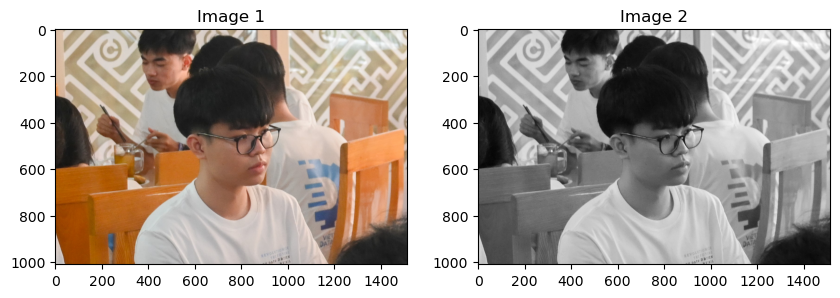

In [66]:
show_images(img1, gray1)

# Scaling

In [67]:
InfoImage(img1)

Width :  1515  Height :  1010  Channel :  3
Red   - Min Intensity:  14  Max Intensity:  255
Green - Min Intensity:  13  Max Intensity:  251
Blue  - Min Intensity:  0  Max Intensity:  253


In [68]:
resize_cubic = cv2.resize(img1,(0, 0),fx=2, fy=2, interpolation = cv2.INTER_CUBIC)
resize_area = cv2.resize(img1,(0, 0),fx=0.5, fy=0.7, interpolation = cv2.INTER_AREA)
resize_linear = cv2.resize(img1,(0, 0),fx=2, fy=2, interpolation = cv2.INTER_LINEAR)

In [69]:
#Thực hiện resize bằng Linear
start_time = time.time()
resize_linear = cv2.resize(img1,(0, 0),fx=2, fy=2, interpolation = cv2.INTER_LINEAR)
end_time = time.time()
execution_time =  end_time - start_time 
print("Execution time of using Linear:",execution_time )


#Thực hiện resize bằng Cubic
start_time = time.time()
#Thu
resize_cubic = cv2.resize(img1,(0, 0),fx=2, fy=2, interpolation = cv2.INTER_CUBIC)
end_time = time.time()
execution_time = end_time - start_time 
print("Execution time of using Cubic:",execution_time )

Execution time of using Linear: 0.010034322738647461
Execution time of using Cubic: 0.017266035079956055


In [70]:
print("Origin image")
print(f"{InfoImage(img1)}")

print("\nInterpolation Cubic")
print(f"{InfoImage(resize_cubic)}")

print("\nInterpolation Linear")
print(f"{InfoImage(resize_linear)}")

print("\nInterpolation Area")
print(f"{InfoImage(resize_area)}")

Origin image
Width :  1515  Height :  1010  Channel :  3
Red   - Min Intensity:  14  Max Intensity:  255
Green - Min Intensity:  13  Max Intensity:  251
Blue  - Min Intensity:  0  Max Intensity:  253
None

Interpolation Cubic
Width :  3030  Height :  2020  Channel :  3
Red   - Min Intensity:  14  Max Intensity:  255
Green - Min Intensity:  10  Max Intensity:  254
Blue  - Min Intensity:  0  Max Intensity:  253
None

Interpolation Linear
Width :  3030  Height :  2020  Channel :  3
Red   - Min Intensity:  15  Max Intensity:  255
Green - Min Intensity:  16  Max Intensity:  251
Blue  - Min Intensity:  0  Max Intensity:  253
None

Interpolation Area
Width :  758  Height :  707  Channel :  3
Red   - Min Intensity:  17  Max Intensity:  255
Green - Min Intensity:  18  Max Intensity:  250
Blue  - Min Intensity:  0  Max Intensity:  252
None


Origin image
Width :  1515  Height :  1010  Channel :  3
Red   - Min Intensity:  14  Max Intensity:  255
Green - Min Intensity:  13  Max Intensity:  251
Blue  - Min Intensity:  0  Max Intensity:  253
None
Interpolation Cubic
Width :  3030  Height :  2020  Channel :  3
Red   - Min Intensity:  14  Max Intensity:  255
Green - Min Intensity:  10  Max Intensity:  254
Blue  - Min Intensity:  0  Max Intensity:  253
None


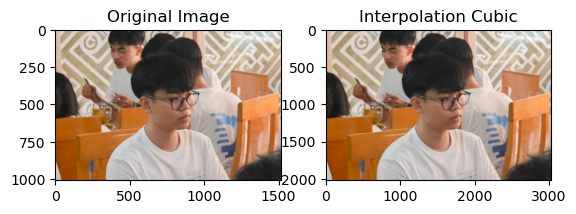

In [71]:
plt.subplot(221),plt.imshow(img1), plt.title("Original Image")
print("Origin image")
print(f"{InfoImage(img1)}")


plt.subplot(222), plt.imshow(resize_cubic), plt.title("Interpolation Cubic")
print("Interpolation Cubic")
print(f"{InfoImage(resize_cubic)}")

(<Axes: title={'center': 'Original Image'}>,
 Text(0.5, 1.0, 'Original Image'))

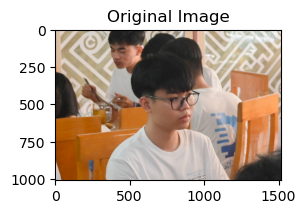

In [72]:
plt.subplot(221),plt.imshow(img1), plt.title("Original Image")


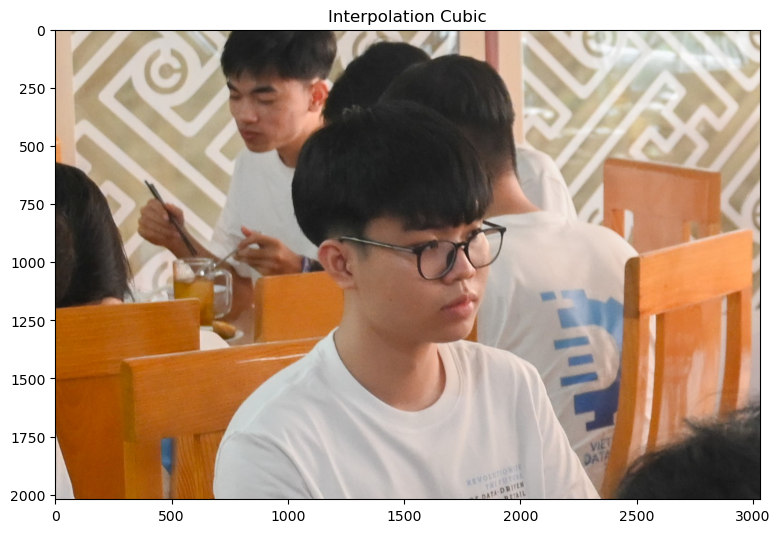

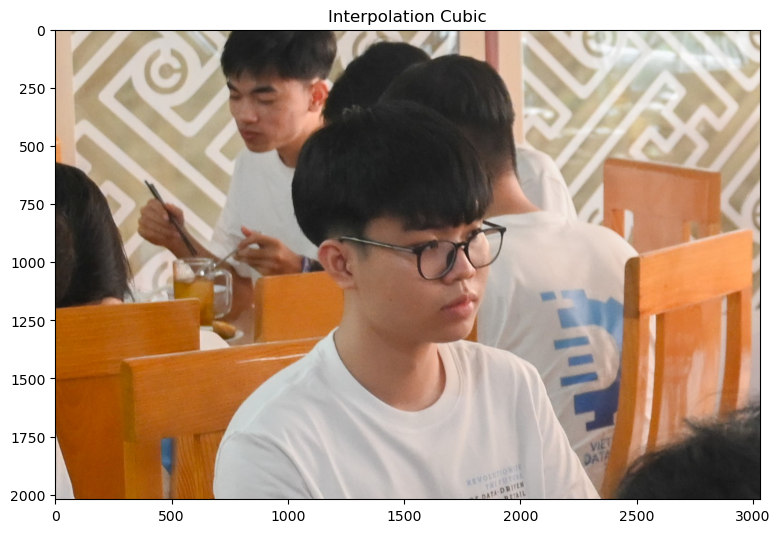

In [73]:
plt.figure(figsize=(20,20)) 
plt.subplot(222), plt.imshow(resize_cubic), plt.title("Interpolation Cubic")
plt.show()

plt.figure(figsize=(20,20)) 
plt.subplot(222), plt.imshow(resize_cubic), plt.title("Interpolation Cubic")
plt.show()


In [74]:
#Tính toán độ sắc nét 
def calculate_sharpness(image):
    # Chuyển hình ảnh sang định dạng xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gy, gx = np.gradient(gray)
    gnorm = np.sqrt(gx**2 + gy**2)
    sharpness = np.average(gnorm)
    return sharpness

sharpness_original = calculate_sharpness(img1)
sharpness_cubic = calculate_sharpness(resize_cubic)
sharpness_area = calculate_sharpness(resize_area)
sharpness_linear = calculate_sharpness(resize_linear)


In [75]:
print("Độ sắc nét của ảnh gốc")
print(sharpness_original)
print("\nĐộ sắc nét của ảnh đã dùng phương pháp cubic")
print(sharpness_cubic)
print("\nĐộ sắc nét của ảnh đã dùng phương pháp linear")
print(sharpness_linear)
print("\nĐộ sắc nét của ảnh đã dùng phương pháp area")
print(sharpness_area)

Độ sắc nét của ảnh gốc
2.7737889902609503

Độ sắc nét của ảnh đã dùng phương pháp cubic
1.5605699548073741

Độ sắc nét của ảnh đã dùng phương pháp linear
1.4328597519903095

Độ sắc nét của ảnh đã dùng phương pháp area
3.9812228003853094


(<Axes: title={'center': 'Interpolation Area'}>,
 Text(0.5, 1.0, 'Interpolation Area'))

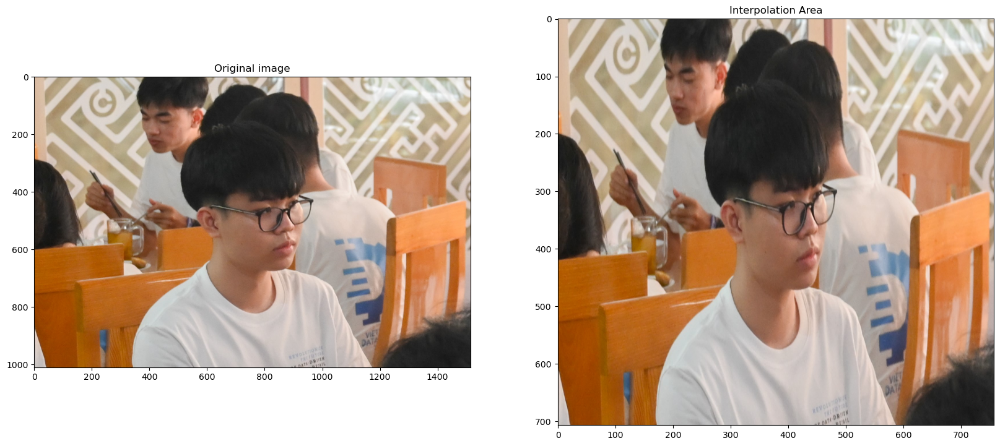

In [76]:
plt.figure(figsize=(20,20)) # Tạo figure với kích thước 10x10 inch
plt.subplot(223), plt.imshow(img1), plt.title("Original image")
plt.subplot(224), plt.imshow(resize_area), plt.title("Interpolation Area")


# Rotation

In [77]:
#Hàm xoay ảnh
def rotate_image(img, degrees):
    # Lấy chiều dài và rộng của ảnh
    (h, w) = img.shape[:2]
    #Định vị tâm ảnh
    center = (w / 2, h / 2)
    # Xoay ảnh bằng cv2.getRotationMatrix2D and cv2.warpAffine
    M = cv2.getRotationMatrix2D(center, degrees, 1.0)
    rotated_img = cv2.warpAffine(img, M, (w, h))
    return rotated_img


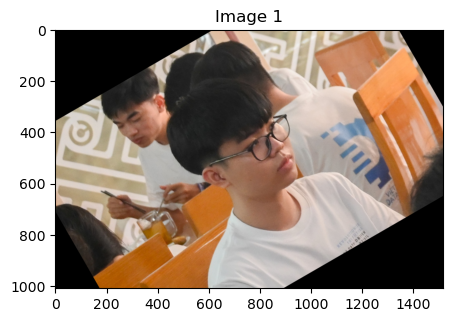

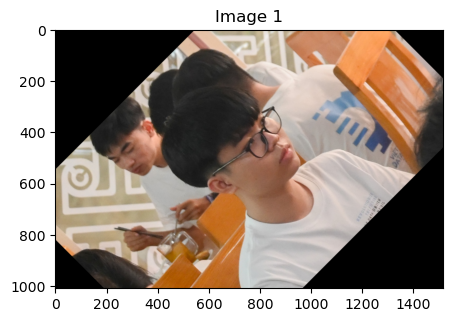

In [78]:
show_images(rotate_image(img1,30))
show_images(rotate_image(img1,45))

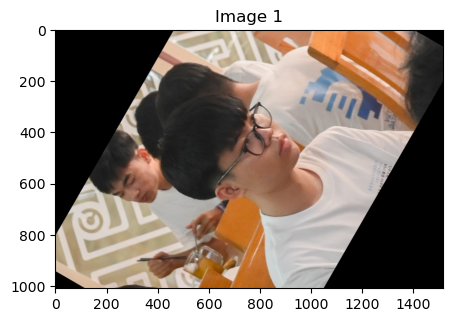

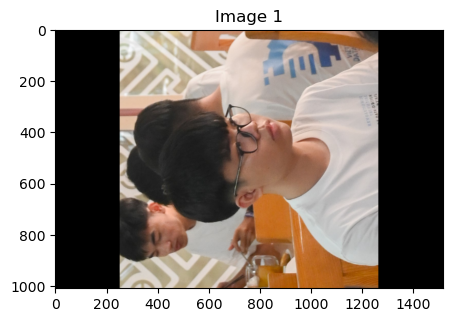

In [79]:
show_images(rotate_image(img1,60))
show_images(rotate_image(img1,90))


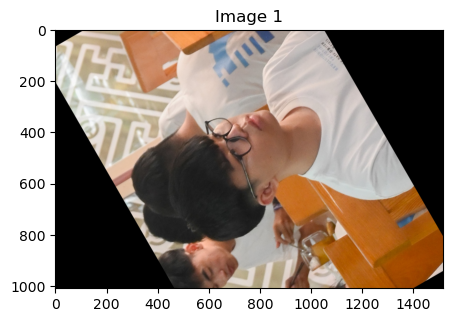

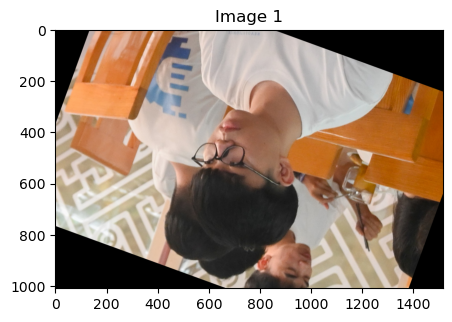

In [80]:
show_images(rotate_image(img1,120))
show_images(rotate_image(img1,160))

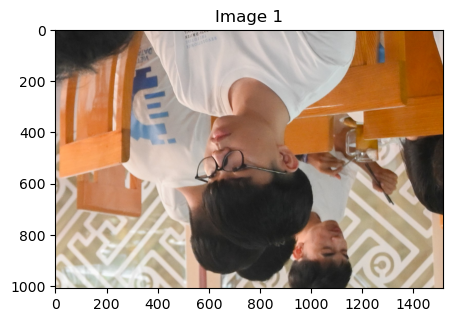

In [81]:
show_images(rotate_image(img1,180))

# Translation 

In [82]:
rows, cols = img1.shape[:2]

TranslationMatrix = np.float32([[1,0,200],[0,1,0]])
img_translation1 = cv2.warpAffine(img1,TranslationMatrix,(cols,rows))

TranslationMatrix = np.float32([[1,0,0],[0,1,200]])
img_translation2 = cv2.warpAffine(img1,TranslationMatrix,(cols,rows))

TranslationMatrix = np.float32([[1,0,200],[0,1,200]])
img_translation3 = cv2.warpAffine(img1,TranslationMatrix,(cols,rows))

TranslationMatrix = np.float32([[1,0,-200],[0,1,-200]])
img_translation4 = cv2.warpAffine(img1,TranslationMatrix,(cols,rows))

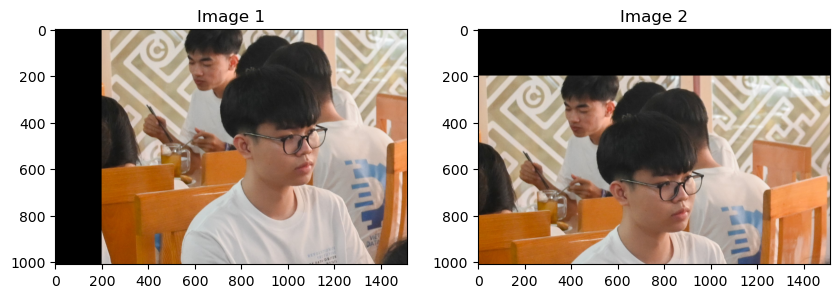

In [83]:
show_images(img_translation1,img_translation2)

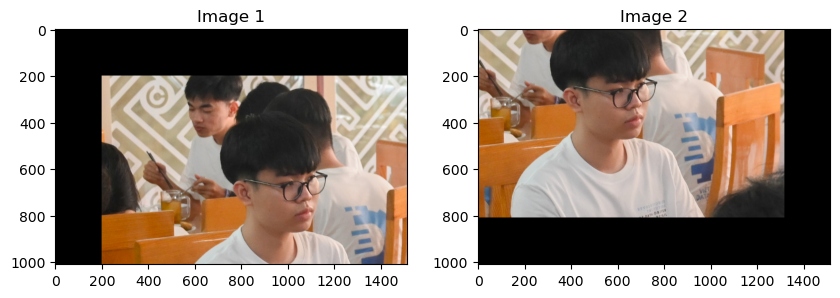

In [84]:
show_images(img_translation3,img_translation4)

#  Shearing

In [85]:
#các điểm gốc
position_from = np.float32([[50,50],[200,50],[50,200]])
#các điểm đích
position_to  = np.float32([[20,100],[200,50],[100,250]])
#ma trận biến đổi từ điểm gốc tới điểm đích
M = cv2.getAffineTransform(position_from,position_to)
dst = cv2.warpAffine(img1,M,(cols,rows))

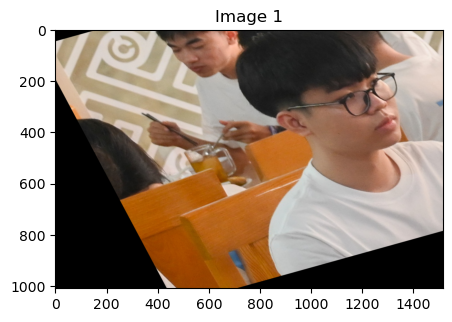

In [86]:
show_images(dst)

In [87]:
position_from = np.float32([[50,50],[200,50],[50,200]])
position_to  = np.float32([[20,200],[200,50],[100,250]])
M = cv2.getAffineTransform(position_from,position_to)
dst = cv2.warpAffine(img1,M,(cols,rows))

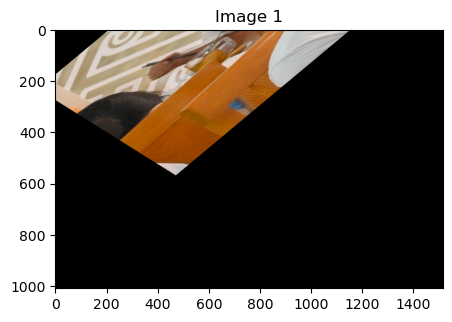

In [88]:
show_images(dst)

# Bài 2 

Width :  1515  Height :  1010  Channel :  3
Red   - Min Intensity:  14  Max Intensity:  255
Green - Min Intensity:  13  Max Intensity:  251
Blue  - Min Intensity:  0  Max Intensity:  253
None


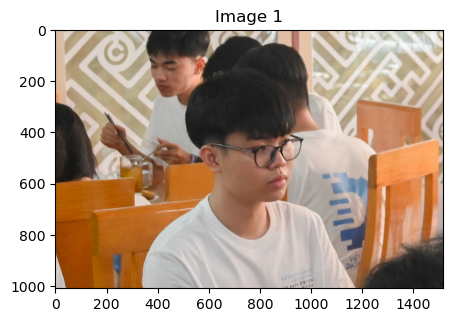

In [89]:
img2 = img1.copy()
gray2 = gray1.copy()
print(InfoImage(img2))
show_images(img2)

# Scaling

In [90]:
smaller_img = img2[::2, ::2]

origin image
Width :  1515  Height :  1010  Channel :  3
Red   - Min Intensity:  14  Max Intensity:  255
Green - Min Intensity:  13  Max Intensity:  251
Blue  - Min Intensity:  0  Max Intensity:  253
None
Smaller image
Width :  758  Height :  505  Channel :  3
Red   - Min Intensity:  14  Max Intensity:  255
Green - Min Intensity:  16  Max Intensity:  251
Blue  - Min Intensity:  0  Max Intensity:  253
None


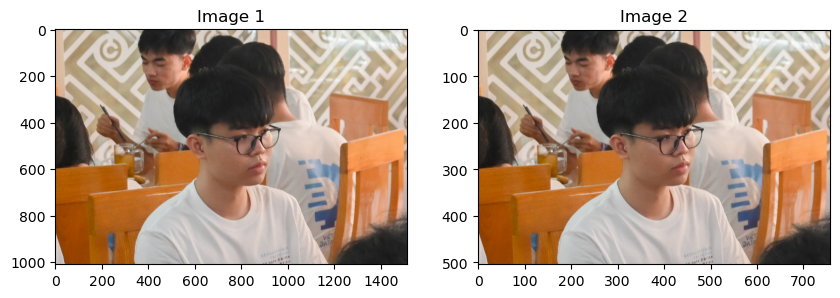

In [91]:
print("origin image")
print(InfoImage(img2))
print('Smaller image')
print(InfoImage(smaller_img))


show_images(img2,smaller_img)

In [92]:
bigger_img = img2.repeat(2, axis=0).repeat(2, axis=1)

origin image
Width :  1515  Height :  1010  Channel :  3
Red   - Min Intensity:  14  Max Intensity:  255
Green - Min Intensity:  13  Max Intensity:  251
Blue  - Min Intensity:  0  Max Intensity:  253
None
Bigger image
Width :  3030  Height :  2020  Channel :  3
Red   - Min Intensity:  14  Max Intensity:  255
Green - Min Intensity:  13  Max Intensity:  251
Blue  - Min Intensity:  0  Max Intensity:  253
None


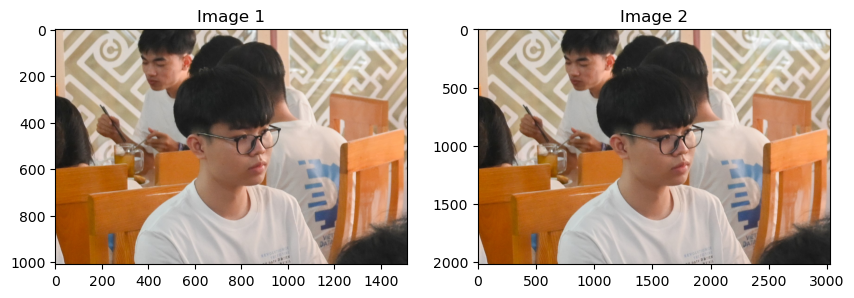

In [93]:
print("origin image")
print(InfoImage(img2))
print('Bigger image')
print(InfoImage(bigger_img))
show_images(img2,bigger_img)

# Rotation

In [57]:
img = Image.open('C:/Users/trand/Documents/Digital Image Processing/data/imgtest.jpg')

In [58]:
def rotate_image(img, angle):

    
    Im = np.array(img)

    #Chuyển góc thành dữ liệu có thể tính toán
    angle = math.radians(angle)
    cosine = math.cos(angle)
    sine = math.sin(angle)
    
    #xác định kích thước của đối tượng PIL
    height = Im.shape[0]  
    width = Im.shape[1]  

    #Xác định kích thước của ảnh mới
    new_height = round(abs(Im.shape[0]*cosine) + abs(Im.shape[1]*sine)) + 1
    new_width = round(abs(Im.shape[1]*cosine) + abs(Im.shape[0]*sine)) + 1

    # Define another image variable of dimensions of new_height and new_width filled with zeros
    Rot_Im = np.zeros((new_height, new_width, Im.shape[2]))

    # Find the centre of the image about which we have to rotate the image
    original_centre_height = round(((Im.shape[0]+1)/2) - 1)  # With respect to the original image
    original_centre_width = round(((Im.shape[1]+1)/2) - 1)  # With respect to the original image

    #Tâm của ảnh mới
    new_centre_height = round((((new_height)+1)/2) - 1)  # With respect to the new image
    new_centre_width = round((((new_width)+1)/2) - 1)  # With respect to the new image

    for i in range(height):
        for j in range(width):
            # Co-ordinates of pixel with respect to the centre of original image
            y = Im.shape[0] - 1 - i - original_centre_height
            x = Im.shape[1] - 1 - j - original_centre_width

            # Co-ordinate of pixel with respect to the rotated image
            new_y = round(x*sine + y*cosine)
            new_x = round(x*cosine - y*sine)

            # Since image will be rotated the centre will change too, so to adjust to that we will need to change new_x and new_y with respect to the new centre
            new_y = new_centre_height - new_y
            new_x = new_centre_width - new_x

            # Adding if check to prevent any errors in the processing
            if 0 <= new_x < new_width and 0 <= new_y < new_height and new_x >= 0 and new_y >= 0:
                Rot_Im[new_y, new_x, :] = Im[i, j, :]  # Writing the pixels to the new destination in the output image

    # Converting array to image
    pil_img = Image.fromarray((Rot_Im).astype(np.uint8))

    # Display the image
    plt.imshow(pil_img)
    plt.show()



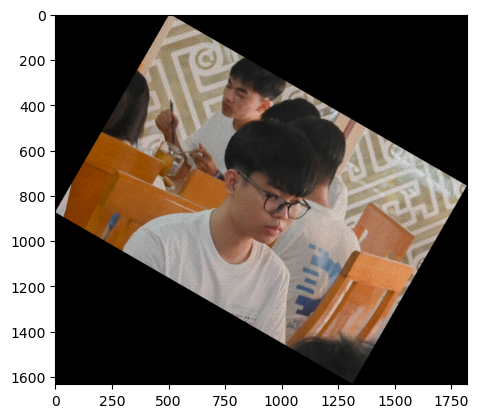

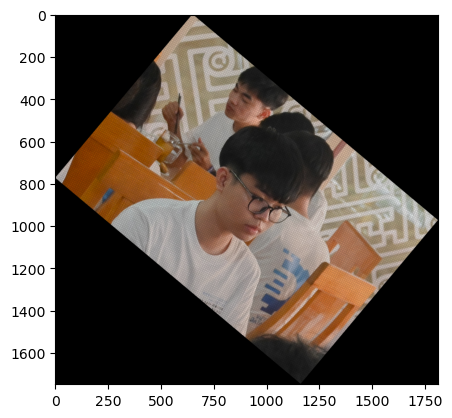

In [60]:
rotate_image(img,30)
rotate_image(img, 40)

In [ ]:
rotate_image(img,30)
rotate_image(img, 45)

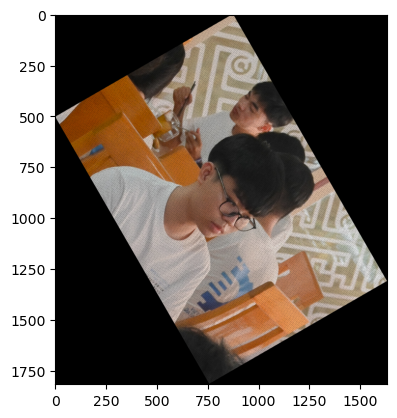

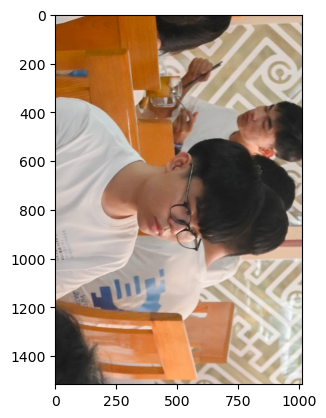

In [61]:
rotate_image(img,60)
rotate_image(img, 90)

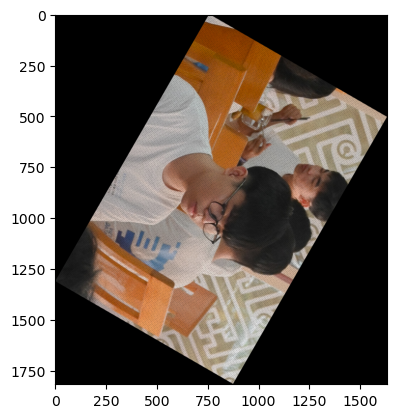

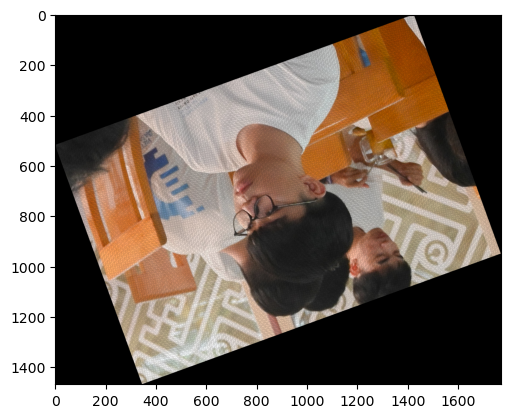

In [62]:
rotate_image(img,120)
rotate_image(img, 160)

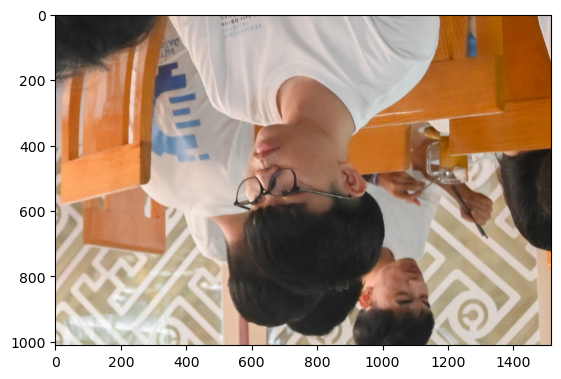

In [63]:
rotate_image(img,180)


# Translation

In [94]:
def translate_image(img, tx, ty):
    Im = np.array(img)

    # Define the translation matrix
    M = np.float32([[1, 0, tx], [0, 1, ty]])

    # Get the dimensions of the image
    rows, cols = Im.shape[:2]

    # Apply the translation
    translated = cv2.warpAffine(Im, M, (cols, rows))

    # Display the image
    plt.imshow(translated)
    plt.show()


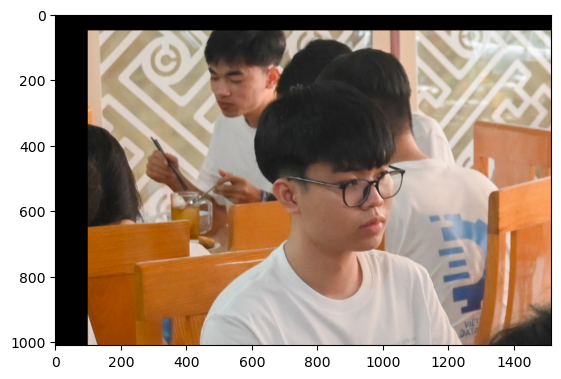

In [96]:
translate_image(img, 100, 50)

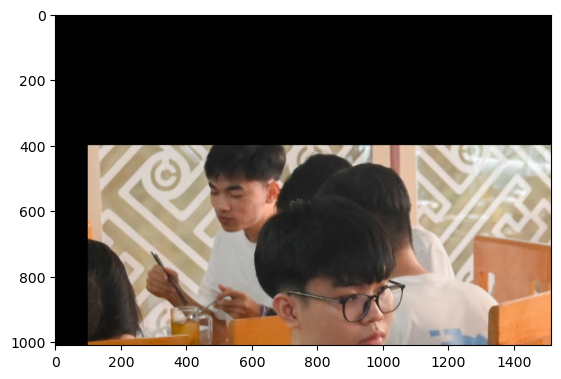

In [98]:
translate_image(img, 100, 400)

In [104]:
from skimage import transform as tf

def shear_image(image, shear):


    # Create Affine transform
    afine_tf = tf.AffineTransform(shear=shear)

    # Apply transform to image data
    modified = tf.warp(image, inverse_map=afine_tf)

    # Display the result
    plt.imshow(modified)
    plt.show()




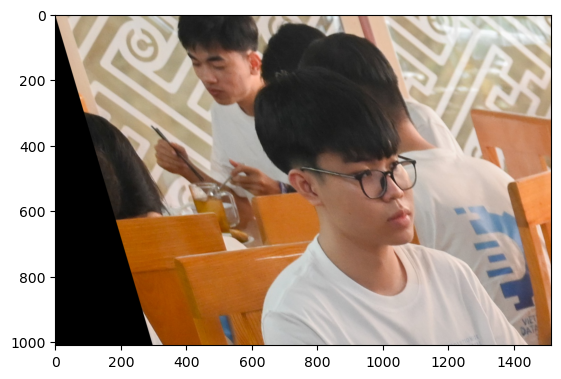

In [106]:
shear_image(img1, 0.3)

# Bài 3

# Scaling


Để phóng to hoặc thu nhỏ một hình ảnh, ta có thể nhân mỗi điểm ảnh (x, y) với một ma trận phóng to/thu nhỏ: 

\begin{bmatrix}
sx & 0 \\
0 & sy \\
\end{bmatrix}

Trong đó, sx và sy là các hệ số phóng to/thu nhỏ theo trục x và y.

# Rotation

\begin{bmatrix}
\cos(\theta) & -\sin(\theta) \\
\sin(\theta) & \cos(\theta) \\
\end{bmatrix}


# Shearing

\begin{bmatrix}
1 & sh_x \\
sh_y & 1 \\
\end{bmatrix}


# Scaling 🡪 Rotation


In [5]:
#Ma trận scaling
scale_factor = 2  
#Tạo ma trận phóng to x2 lần trục hoành và trục tung
scaling_matrix = np.array([[scale_factor, 0], [0, scale_factor]])

#Ma trận xoay
#Đổi đơn vị góc từ độ sang radians
theta = np.radians(30)  
#Tạo ma trận xoay
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])

#Kết hợp  2 ma trận
composite_matrix = np.dot(scaling_matrix, rotation_matrix)

print("Composite Matrix:")
print(composite_matrix)


Composite Matrix:
[[ 1.73205081 -1.        ]
 [ 1.          1.73205081]]


# Rotation 🡪 Shearing

In [6]:

#Ma trận xoay
#Đổi đơn vị góc từ độ sang radians
theta = np.radians(30)  
#Tạo ma trận xoay
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])


#ma trận xén nhỏ
shear_factor = 2  # 
#Tạo ma trận xén
shearing_matrix = np.array([[1, shear_factor], [0, 1]])

#Hợp 2 ma trận
composite_matrix = np.dot(rotation_matrix, shearing_matrix)

print("Composite Matrix:")
print(composite_matrix)


Composite Matrix:
[[0.8660254  1.23205081]
 [0.5        1.8660254 ]]


# Scaling 🡪 Rotation 🡪 Shearing

In [8]:
#Ma trận scaling
scale_factor = 2  
#Tạo ma trận phóng to x2 lần trục hoành và trục tung
scaling_matrix = np.array([[scale_factor, 0], [0, scale_factor]])

#Ma trận xoay
#Đổi đơn vị góc từ độ sang radians
theta = np.radians(30)  
#Tạo ma trận xoay
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])



#ma trận xén nhỏ
shear_factor = 2  # 
#Tạo ma trận xén
shearing_matrix = np.array([[1, shear_factor], [0, 1]])


#Kết hợp ma trận
composite_matrix = np.dot(scaling_matrix, rotation_matrix)
composite_matrix = np.dot(composite_matrix, shearing_matrix)

print("Composite Matrix:")
print(composite_matrix)


Composite Matrix:
[[1.73205081 2.46410162]
 [1.         3.73205081]]


# Bài 4

In [7]:
#Đọc ảnh
img4 = plt.imread('C:/Users/trand/Documents/Digital Image Processing/data/img20.jpg')
#Chuyển đổi ảnh sang ảnh xám
gray4 = cv2.cvtColor(img4, cv2.COLOR_RGB2GRAY)

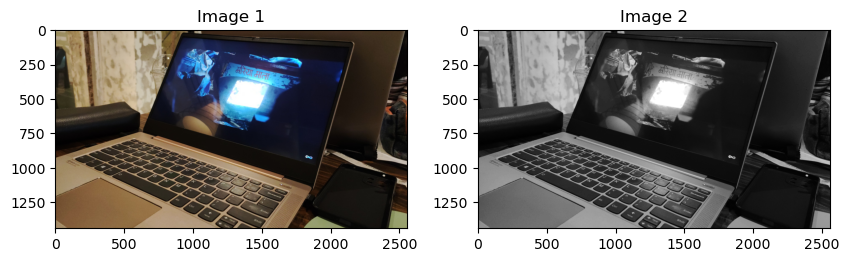

In [8]:
show_images(img4,gray4)

In [9]:
InfoImage(img4)

Width :  2560  Height :  1440  Channel :  3
Red   - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue  - Min Intensity:  0  Max Intensity:  255


In [10]:
#Giảm độ phân giải của ảnh xuống
resize_area_4 = cv2.resize(img4,(0, 0),fx=0.1664, fy=0.1664, interpolation = cv2.INTER_AREA)

Width :  426  Height :  240  Channel :  3
Red   - Min Intensity:  1  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue  - Min Intensity:  1  Max Intensity:  255
None


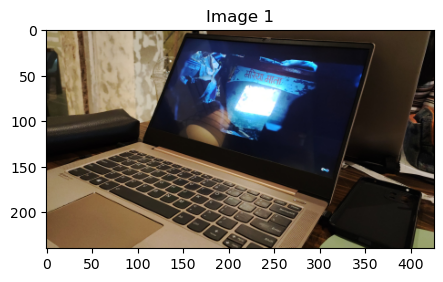

In [30]:
print(InfoImage(resize_area_4))
show_images(resize_area_4)

In [13]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.ticker import NullLocator

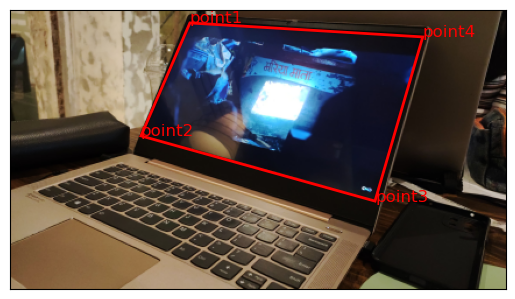

In [44]:
fig, ax = plt.subplots(1)

# Hiển thị ảnh
ax.imshow(resize_area_4)

# Đặt tọa độ của 4 điểm (x, y)
point1 = (154, 11)
point2 = (112, 108)
point3 = (313, 164)
point4 = (354, 23)


# Vẽ hình chữ nhật bằng cách nối 4 điểm
rectangle = patches.Polygon([point1, point2, point3, point4], closed=True, edgecolor='r', linewidth=2, fill=False)
ax.add_patch(rectangle)
#Chú thích trên ảnh các điểm
plt.text(point1[0], point1[1], 'point1', color='red', fontsize=12)
plt.text(point2[0], point2[1], 'point2', color='red', fontsize=12)
plt.text(point3[0], point3[1], 'point3', color='red', fontsize=12)
plt.text(point4[0], point4[1], 'point4', color='red', fontsize=12)
# Ẩn các tick trục
ax.xaxis.set_major_locator(NullLocator())
ax.yaxis.set_major_locator(NullLocator())

# Hiển thị hình ảnh với hình chữ nhật
plt.show()

In [53]:
# Đặt tọa độ của 4 điểm (x, y) trên ảnh gốc
src_pts = np.float32([[154, 11], [112, 108], [313, 164], [354, 23]])

# Đặt tọa độ của 4 điểm trên ảnh đích (ảnh sau khi biến đổi)
dst_pts = np.float32([[0, 0], [0, resize_area_4.shape[0]], [resize_area_4.shape[1], resize_area_4.shape[0]], [resize_area_4.shape[1], 0]])

# Tính ma trận biến đổi Perspective
matrix = cv2.getPerspectiveTransform(src_pts, dst_pts)

# Thực hiện biến đổi Perspective
img5 = cv2.warpPerspective(resize_area_4, matrix, (resize_area_4.shape[1], resize_area_4.shape[0]))

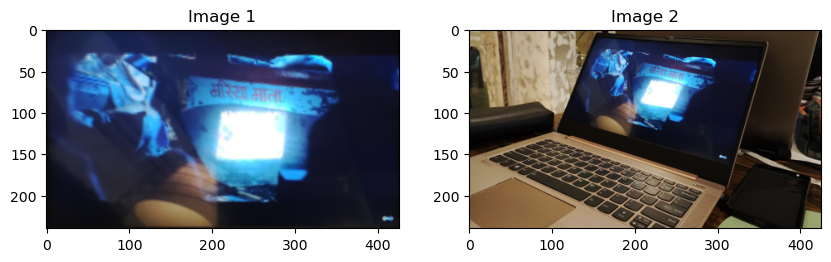

In [107]:
show_images(img5,resize_area_4)

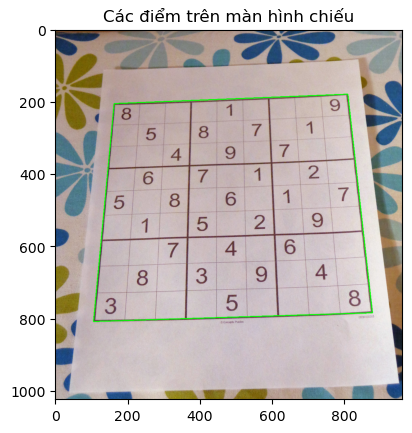

Tọa độ các điểm trên màn hình chiếu:
[[809 180]
 [163 206]
 [106 809]
 [877 785]]


In [9]:


# Đọc ảnh
image = cv2.imread('C:/Users/trand/Documents/Digital Image Processing/data/img8.jpg')

# Chuyển đổi ảnh sang ảnh xám
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Làm mờ ảnh để giảm nhiễu
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Phát hiện các cạnh trong ảnh
edges = cv2.Canny(blurred, 50, 150)

# Tìm contour trong ảnh
contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Sắp xếp các contour theo diện tích giảm dần
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]

for contour in contours:
    # Xác định đường bao của contour
    epsilon = 0.02 * cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, epsilon, True)

    # Nếu contour có 4 đỉnh, giả sử nó là màn hình chiếu
    if len(approx) == 4:
        screen_pts = approx.reshape(4, 2)
        break

# Vẽ contour lên ảnh để kiểm tra
cv2.drawContours(image, [screen_pts], -1, (0, 255, 0), 2)

# Hiển thị ảnh và contour
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Các điểm trên màn hình chiếu')
plt.show()

# Hiển thị tọa độ của các điểm trên màn hình chiếu
print("Tọa độ các điểm trên màn hình chiếu:")
print(screen_pts)


In [18]:
# Đặt tọa độ của 4 điểm (x, y) trên ảnh gốc
src_pts = screen_pts.astype(np.float32)

# Đặt tọa độ của 4 điểm trên ảnh đích (ảnh sau khi biến đổi)
dst_pts = np.float32([[0, 0], [0, image.shape[0]], [image.shape[1], image.shape[0]], [image.shape[1], 0]])

# Tính ma trận biến đổi Perspective
matrix = cv2.getPerspectiveTransform(src_pts, dst_pts)

# Thực hiện biến đổi Perspective

img6 = cv2.warpPerspective(image, matrix, (image.shape[1], image.shape[0]))
img6 = cv2.rotate(img6, cv2.ROTATE_90_CLOCKWISE)

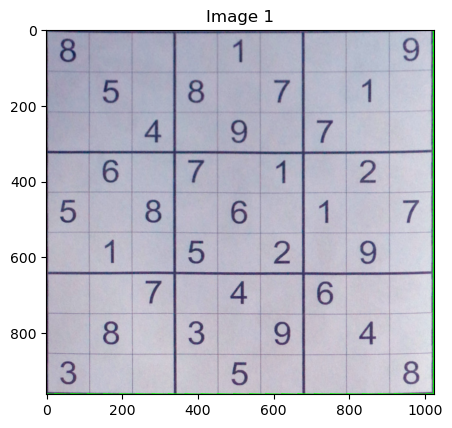

In [19]:
show_images(img6)

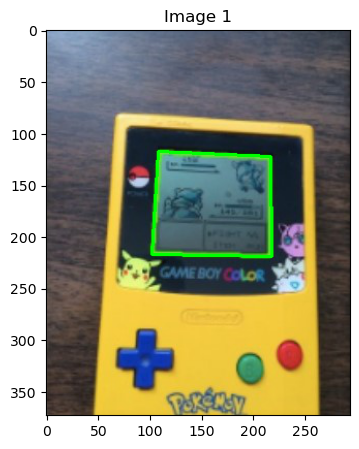

Tọa độ các điểm trên màn hình chiếu:
[[108 117]
 [102 217]
 [218 219]
 [217 122]]


In [122]:


# Đọc ảnh
image = plt.imread('C:/Users/trand/Documents/Digital Image Processing/data/img23.jpg')

# Chuyển đổi ảnh sang ảnh xám
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)




# Phát hiện các cạnh trong ảnh
edges = cv2.Canny(gray, 50, 150)

# Tìm contour trong ảnh
contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Sắp xếp các contour theo diện tích giảm dần
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]

for contour in contours:
    # Xác định đường bao của contour
    epsilon = 0.02 * cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, epsilon, True)

    # Nếu contour có 4 đỉnh, giả sử nó là màn hình chiếu
    if len(approx) == 4:
        screen_pts = approx.reshape(4, 2)
        break

# Vẽ contour lên ảnh để kiểm tra
cv2.drawContours(image, [screen_pts], -1, (0, 255, 0), 2)

# Hiển thị ảnh và contour
show_images(image)

# Hiển thị tọa độ của các điểm trên màn hình chiếu
print("Tọa độ các điểm trên màn hình chiếu:")
print(screen_pts)


In [123]:
# Đặt tọa độ của 4 điểm (x, y) trên ảnh gốc
src_pts = screen_pts.astype(np.float32)

# Đặt tọa độ của 4 điểm trên ảnh đích (ảnh sau khi biến đổi)
dst_pts = np.float32([[0, 0], [0, image.shape[0]], [image.shape[1], image.shape[0]], [image.shape[1], 0]])

# Tính ma trận biến đổi Perspective
matrix = cv2.getPerspectiveTransform(src_pts, dst_pts)

# Thực hiện biến đổi Perspective

img6 = cv2.warpPerspective(image, matrix, (image.shape[1], image.shape[0]))


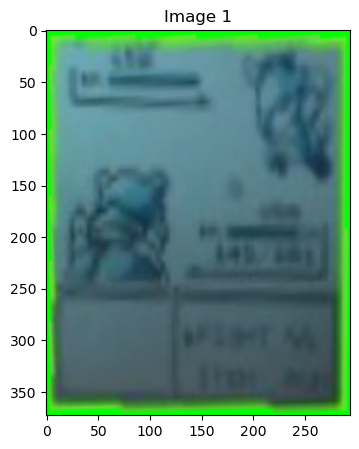

In [124]:
show_images(img6)